# Description - Prepare Data for NBS Analysis on Matlab

This notebook prepares connectivity matrices for doing the NBS analyses on Matlab. At this point we have selected scans corresponding to the two populations that we want to compare and all that's left is to generate the design matrices and create a copy of the FC matrices in a format that NBS can understand.

In [1]:
import os.path as osp
import os
import pandas as pd
import numpy as np
import xarray as xr
from sfim_lib.io.afni import load_netcc
from shutil import rmtree
from tqdm import tqdm
from IPython import display
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
import seaborn as sns
from scipy.spatial.distance import squareform

In [2]:
from utils.basics import RESOURCES_NBS_DIR, ATLASES_DIR, DATA_DIR, SNYCQ_CLUSTERS_INFO_PATH, SNYCQ_W_PATH, RESOURCES_DINFO_DIR
from utils.basics import FB_400ROI_ATLAS_NAME, FB_400ROI_ATLAS_PATH, FB_400ROI_BRAINNET_NODES_PATH
from utils.basics import FB_200ROI_ATLAS_NAME, FB_200ROI_ATLAS_PATH, FB_200ROI_BRAINNET_NODES_PATH
from utils.basics import get_sbj_scan_list

In [3]:
import matplotlib.pyplot as plt
import hvplot.pandas
print(hvplot.__version__)

0.8.4


In [4]:
print("++ INFO: RESOURCES_NBS_DIR=%s" % RESOURCES_NBS_DIR)

++ INFO: RESOURCES_NBS_DIR=/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs


In [5]:
ATLAS_NAME = FB_400ROI_ATLAS_NAME

In [6]:
roi_info, Nrois = {},{}
ATLASINFO_PATH       = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
roi_info[ATLAS_NAME] = pd.read_csv(ATLASINFO_PATH)
Nrois[ATLAS_NAME]    = roi_info[ATLAS_NAME].shape[0]

# 1. Create input files for NBS and BrainNet packages

These two software requires a few additional files with information about ROI names, centroids and labels. We generate those next for the two atlases of interest:

* ```<ATLAS_NAME>_BrainNet_Nodes.node```: Information about ROI names and centroids for BrainNet.
* ```<ATLAS_NAME>_NBS_Node_Coordinates.txt```: ROI centroids in NBS format.
* ```<ATLAS_NAME>_NBS_Node_Labels.txt```: ROI names in NBS format.

In [7]:
Nw2Id = {'Vis':1,'SomMot':2,'DorsAttn':3,'SalVentAttn':4,'Limbic':5,'Cont':6,'Default':7,'Subcortical':8}

In [8]:
roi_info,Nrois={},{}
for ATLAS_NAME,BRAINNET_NODES_PATH  in zip([FB_400ROI_ATLAS_NAME],[FB_400ROI_BRAINNET_NODES_PATH]):
    # Load necessary info in memory
    # =============================
    ATLASINFO_PATH       = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
    roi_info[ATLAS_NAME] = pd.read_csv(ATLASINFO_PATH)
    Nrois[ATLAS_NAME]    = roi_info[ATLAS_NAME].shape[0]
    # Create Brainnet Nodes data structure
    # ====================================
    BRAINNET_NODES_df               = roi_info[ATLAS_NAME][['pos_R','pos_A','pos_S','ROI_Name']].copy()
    BRAINNET_NODES_df['Node Size']  = 1
    BRAINNET_NODES_df['Node Color'] = [Nw2Id[n.split('_')[1]] for n in BRAINNET_NODES_df['ROI_Name']]
    BRAINNET_NODES_df = BRAINNET_NODES_df[['pos_R','pos_A','pos_S','Node Color','Node Size','ROI_Name']]
    # Save to disk
    # ============
    BRAINNET_NODES_df.to_csv(BRAINNET_NODES_PATH, sep=' ', index=None, header=None)
    print('++ INFO: BrainNet_Node file written to disk:   [%s]' % BRAINNET_NODES_PATH)
    # Save coordinate file to disk for NBS
    # ====================================
    coor_file_path = osp.join(RESOURCES_NBS_DIR,ATLAS_NAME,'{ATLAS_NAME}_NBS_Node_Coordinates.txt'.format(ATLAS_NAME=ATLAS_NAME))
    BRAINNET_NODES_df[['pos_R','pos_A','pos_S']].to_csv(coor_file_path, sep=' ', index=None, header=None)
    print("++ INFO: NBS Coordinate file written to disk: [%s]" % coor_file_path)
    # Save label file to disk for NBS
    # ===============================
    label_file_path = osp.join(RESOURCES_NBS_DIR,ATLAS_NAME,'{ATLAS_NAME}_NBS_Node_Labels.txt'.format(ATLAS_NAME=ATLAS_NAME))
    BRAINNET_NODES_df['ROI_Name'].to_csv(label_file_path, sep=' ', index=None, header=None)
    print("++ INFO: NBS Label file written to disk:      [%s]" % label_file_path)
    print("++ =====================================")

++ INFO: BrainNet_Node file written to disk:   [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/Schaefer2018_400Parcels_7Networks_AAL2_BrainNet_Nodes.node]
++ INFO: NBS Coordinate file written to disk: [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/Schaefer2018_400Parcels_7Networks_AAL2_NBS_Node_Coordinates.txt]
++ INFO: NBS Label file written to disk:      [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/Schaefer2018_400Parcels_7Networks_AAL2_NBS_Node_Labels.txt]
++ =====================================


***
# 2. Create Design Matrix for NBS

For this version of the NBS analyses, we will select a single scan per subject/cluster if more than one is available. 

We will select whichever scan is closest to the extreme corners. 

To start, we will load the W matrix for all 471 scans. This matrix contains the location of each scan in the 2D space estimated by sbcNNMF

In [9]:
print(pd.__version__)
W = pd.read_csv(SNYCQ_W_PATH,index_col=['Subject','Run'])

1.5.3


Load information about cluter membership for all 471 scans

In [10]:
clusters_info = pd.read_csv(SNYCQ_CLUSTERS_INFO_PATH, index_col=['Subject','Run'])

Next, we merge both dataframes into a single dataframe that has both cluster membership and W coordinates

In [11]:
mot_info = pd.read_csv(osp.join(RESOURCES_DINFO_DIR,'motion_confounds.csv'),index_col=['Subject','Run'])

In [12]:
W_plus        = pd.concat([W,clusters_info,mot_info],axis=1)

We now remove all scans in the Intermediate group. So far this is equivalent to the original NBS scan selection (Scan-Level)

In [13]:
W_plus = W_plus[W_plus['Cluster Label'] != 'Intermediate']

Get a list of subjects that were in the two clusters of interest

In [14]:
sbj_list       = W_plus.index.get_level_values('Subject').unique()
print(len(sbj_list))

83


We define the extreme corners for each cluster. We need those to compute the euclidean distance

## Full Sample

In [15]:
final_scan_list = {}
final_scan_list['All_Scans'] = W_plus.copy()
final_scan_list['All_Scans']['Cluster Label'].value_counts()

Image-Pos-Others    81
Surr-Neg-Self       78
Name: Cluster Label, dtype: int64

In [16]:
final_scan_list['All_Scans-no-across'] = W_plus.copy()
for sbj in sbj_list:
    this_sbj_scans = W_plus.loc[sbj].copy()
    clusters_sbj_has_scans = list(this_sbj_scans['Cluster Label'].unique())
    #####
    # If subject has scans in both cluster, then all the scans for the subject get removed
    if len(clusters_sbj_has_scans) > 1:
        final_scan_list['All_Scans-no-across'].drop(sbj,axis=0, level='Subject', inplace=True)
        num_scans = this_sbj_scans.shape[0]
        num_scans_in_F1 = this_sbj_scans[this_sbj_scans['Cluster Label']=='Image-Pos-Others'].shape[0]
        num_scans_in_F2 = this_sbj_scans[this_sbj_scans['Cluster Label']=='Surr-Neg-Self'].shape[0]
        print(f'++ WARNING [{sbj} | {num_scans}] This subject has scans in both groups [{num_scans_in_F1} + {num_scans_in_F2}]')
        continue
    #####

++ WARNING [sub-010098 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010101 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010147 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010173 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010216 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010224 | 2] This subject has scans in both groups [1 + 1]
++ WARNING [sub-010060 | 3] This subject has scans in both groups [1 + 2]


# Visualize Selection

In [17]:
FINAL_SELECTION = 'All_Scans-no-across'
#FINAL_SELECTION   = 'All_Scans'
SUBJECT_LEVEL_DIR = osp.join(RESOURCES_NBS_DIR,ATLAS_NAME,FINAL_SELECTION)
SELECTED_SCANS    = final_scan_list[FINAL_SELECTION]
print('++ INFO: Files specific to subject-level NBS analyses --> %s' % SUBJECT_LEVEL_DIR)

++ INFO: Files specific to subject-level NBS analyses --> /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across


In [18]:
SELECTED_SCANS

Factor 1  Factor 2  Cluster ID  \
Subject    Run                                                         
sub-010014 post-ses-02-run-02-acq-AP  0.709076  0.972487           2   
           post-ses-02-run-02-acq-PA  0.680004  0.938335           2   
sub-010080 post-ses-02-run-02-acq-PA  1.000000  0.400438           1   
sub-010082 post-ses-02-run-01-acq-AP  0.696976  0.948900           2   
           post-ses-02-run-01-acq-PA  0.627213  0.797629           2   
...                                        ...       ...         ...   
sub-010072 post-ses-02-run-02-acq-PA  0.777140  0.279428           1   
sub-010076 post-ses-02-run-01-acq-AP  0.963301  0.385111           1   
sub-010077 post-ses-02-run-01-acq-AP  0.934441  0.280481           1   
           post-ses-02-run-01-acq-PA  0.835110  0.334411           1   
           post-ses-02-run-02-acq-AP  0.766250  0.234898           1   

                                         Cluster Label  Mean Rel Motion  
Subject    Run                                                           
sub-010014 post-ses-02-run-02-acq-AP     Surr-Neg-Self         0.087601  
           post-ses-02-run-02-acq-PA     Surr-Neg-Self         0.070103  
sub-010080 post-ses-02-run-02-acq-PA  Image-Pos-Others         0.092674  
sub-010082 post-ses-02-run-01-acq-AP     Surr-Neg-Self         0.116003  
           post-ses-02-run-01-acq-PA     Surr-Neg-Self         0.071737  
...                                                ...              ...  
sub-010072 post-ses-02-run-02-acq-PA  Image-Pos-Others         0.062171  
sub-010076 post-ses-02-run-01-acq-AP  Image-Pos-Others         0.094131  
sub-010077 post-ses-02-run-01-acq-AP  Image-Pos-Others         0.106014  
           post-ses-02-run-01-acq-PA  Image-Pos-Others         0.084960  
           post-ses-02-run-02-acq-AP  Image-Pos-Others         0.106679  

[144 rows x 5 columns]

In [19]:
if osp.exists(SUBJECT_LEVEL_DIR):
    #rmtree(SUBJECT_LEVEL_DIR)
    print('++ WARNING: This folder already exists!!!!!! pre-existing folder [%s]' % SUBJECT_LEVEL_DIR)
else:
    os.makedirs(SUBJECT_LEVEL_DIR)
    print('++ INFO: Regenerating empty folder [%s]' % SUBJECT_LEVEL_DIR)

++ WARNING: This folder already exists!!!!!! pre-existing folder [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across]


In [20]:
print('++ Number of scans across both clustes: %d scans' % SELECTED_SCANS.index.get_level_values('Subject').shape[0])
print('++ Number of subjects across both clusters: %d subjects' % SELECTED_SCANS.index.get_level_values('Subject').unique().shape[0])

++ Number of scans across both clustes: 144 scans
++ Number of subjects across both clusters: 76 subjects


In [21]:
print('++ Number of scans per cluster')
SELECTED_SCANS['Cluster Label'].value_counts()

++ Number of scans per cluster


Image-Pos-Others    74
Surr-Neg-Self       70
Name: Cluster Label, dtype: int64

In [22]:
final_scan_list[FINAL_SELECTION].sort_index(level=['Subject','Run']).reset_index().groupby('Subject').count().sort_values(by='Run').hvplot.bar(x='Subject',y='Run', width=1500).opts(xrotation=90)

:Bars   [Subject]   (Run)

# Create Design Matrix
Transform the same information into a dictionary

In [23]:
print(FINAL_SELECTION)
final_scan_list[FINAL_SELECTION]

All_Scans-no-across


Factor 1  Factor 2  Cluster ID  \
Subject    Run                                                         
sub-010014 post-ses-02-run-02-acq-AP  0.709076  0.972487           2   
           post-ses-02-run-02-acq-PA  0.680004  0.938335           2   
sub-010080 post-ses-02-run-02-acq-PA  1.000000  0.400438           1   
sub-010082 post-ses-02-run-01-acq-AP  0.696976  0.948900           2   
           post-ses-02-run-01-acq-PA  0.627213  0.797629           2   
...                                        ...       ...         ...   
sub-010072 post-ses-02-run-02-acq-PA  0.777140  0.279428           1   
sub-010076 post-ses-02-run-01-acq-AP  0.963301  0.385111           1   
sub-010077 post-ses-02-run-01-acq-AP  0.934441  0.280481           1   
           post-ses-02-run-01-acq-PA  0.835110  0.334411           1   
           post-ses-02-run-02-acq-AP  0.766250  0.234898           1   

                                         Cluster Label  Mean Rel Motion  
Subject    Run                                                           
sub-010014 post-ses-02-run-02-acq-AP     Surr-Neg-Self         0.087601  
           post-ses-02-run-02-acq-PA     Surr-Neg-Self         0.070103  
sub-010080 post-ses-02-run-02-acq-PA  Image-Pos-Others         0.092674  
sub-010082 post-ses-02-run-01-acq-AP     Surr-Neg-Self         0.116003  
           post-ses-02-run-01-acq-PA     Surr-Neg-Self         0.071737  
...                                                ...              ...  
sub-010072 post-ses-02-run-02-acq-PA  Image-Pos-Others         0.062171  
sub-010076 post-ses-02-run-01-acq-AP  Image-Pos-Others         0.094131  
sub-010077 post-ses-02-run-01-acq-AP  Image-Pos-Others         0.106014  
           post-ses-02-run-01-acq-PA  Image-Pos-Others         0.084960  
           post-ses-02-run-02-acq-AP  Image-Pos-Others         0.106679  

[144 rows x 5 columns]

In [24]:
n_sbjs  = len(SELECTED_SCANS.index.get_level_values(level='Subject').unique())
n_scans = SELECTED_SCANS.shape[0]
print('++ INFO: Number of subjects = %d' % n_sbjs)
print('++ INFO: Number of scans    = %d' % n_scans)

++ INFO: Number of subjects = 76
++ INFO: Number of scans    = 144


In [25]:
scans_per_cluster={cl_label:final_scan_list[FINAL_SELECTION][final_scan_list[FINAL_SELECTION]['Cluster Label']==cl_label].index for cl_label in ['Image-Pos-Others','Surr-Neg-Self']}

Forth, we print again the number of scans per cluster, as a sanity check

In [26]:
[(k,i.shape) for k,i in scans_per_cluster.items()]

[('Image-Pos-Others', (74,)), ('Surr-Neg-Self', (70,))]

Fifth, we generate the design matrix taking into accoun only the scans that we use in this part of the analysis (namely those in clusters ```Large F1``` and ```Large F2```)

In [27]:
DESIGN_MATRIX = np.vstack([np.tile(np.array([1,0]),(len(scans_per_cluster['Image-Pos-Others']),1)),
                           np.tile(np.array([0,1]),(len(scans_per_cluster['Surr-Neg-Self']),1))])
DESIGN_MATRIX_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix.txt')
np.savetxt(DESIGN_MATRIX_PATH,DESIGN_MATRIX,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(DESIGN_MATRIX.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 2)]


In [28]:
DESIGN_MATRIX_B = np.vstack([np.tile(np.array([1,0]),(len(scans_per_cluster['Image-Pos-Others']),1)),
                           np.tile(np.array([1,1]),(len(scans_per_cluster['Surr-Neg-Self']),1))])
DESIGN_MATRIX_B_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_B.txt')
np.savetxt(DESIGN_MATRIX_B_PATH,DESIGN_MATRIX_B,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(DESIGN_MATRIX.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 2)]


***
# 3. Create Copies of Scan-wise FC Matrices in NBS folders

Count how many scans we have in total across the two clusters of interest

In [29]:
#_,scans_list = get_sbj_scan_list(when='post_motion', return_snycq=False)
Nscans       = final_scan_list[FINAL_SELECTION].set_index('Cluster Label').loc[['Image-Pos-Others','Surr-Neg-Self']].shape[0]
print(Nscans)

144


## 3.1. Load all FC matrices into a XR.DataArray 

In [30]:
%%time
sfc_Z_xr={}
for ATLAS_NAME in [ATLAS_NAME]:
    # Create Empty Numpy Array where to hold all FC matrices. At the end we will move this into an Xarray
    # ===================================================================================================
    sfc_Z_arr = np.empty((Nscans,Nrois[ATLAS_NAME],Nrois[ATLAS_NAME])) * np.nan
    scan_idx      = 0
    scan_name_idx = []
    # For all clusters of interest
    # ============================
    for cluster_id in ['Image-Pos-Others','Surr-Neg-Self']:
        # For each scan in a given cluster
        # ================================
        for sbj,run in scans_per_cluster[cluster_id]:
            # Load FC matrix from disk
            # ========================
            scan_name_idx.append('.'.join([sbj,run]))
            _,_,sesID,_,runID,_,acqID = run.split('-')
            sfc_path = osp.join(DATA_DIR,'PrcsData',sbj,'preprocessed','func','pb06_staticFC','{acqID}_run-{runID}.{ATLAS_NAME}_000.netcc'.format(acqID=acqID,runID=runID, ATLAS_NAME=ATLAS_NAME))
            aux_cc_r = load_netcc(sfc_path)
            # Apply Fisher's transformation
            # =============================
            aux_cc_Z = aux_cc_r.apply(np.arctanh)
            np.fill_diagonal(aux_cc_Z.values,1)
            sfc_Z_arr[scan_idx,:,:] = aux_cc_Z
            # Update counter
            # ==============
            scan_idx = scan_idx + 1
            del aux_cc_r, aux_cc_Z
    # Save all FC matrixes for a given atlas in XR.Array Form
    # =======================================================
    sfc_Z_xr[ATLAS_NAME] = xr.DataArray(sfc_Z_arr,
                        dims=['scan','roi_x','roi_y'],
                        coords={'scan':scan_name_idx,
                                'roi_x':roi_info[ATLAS_NAME]['ROI_ID'],
                                'roi_y':roi_info[ATLAS_NAME]['ROI_ID']})
    del sfc_Z_arr

CPU times: user 3.17 s, sys: 721 ms, total: 3.89 s
Wall time: 3.93 s


In [31]:
sfc_Z_xr

{'Schaefer2018_400Parcels_7Networks_AAL2': <xarray.DataArray (scan: 144, roi_x: 380, roi_y: 380)>
 array([[[ 1.        ,  0.73038364,  0.73038364, ..., -0.15421091,
           0.0018    , -0.07916496],
         [ 0.73038364,  1.        ,  0.4110926 , ..., -0.05094403,
           0.09004256,  0.02830756],
         [ 0.73038364,  0.4110926 ,  1.        , ..., -0.17578861,
          -0.02500521, -0.0017    ],
         ...,
         [-0.15421091, -0.05094403, -0.17578861, ...,  1.        ,
           0.3215414 ,  0.25168294],
         [ 0.0018    ,  0.09004256, -0.02500521, ...,  0.3215414 ,
           1.        ,  0.2180933 ],
         [-0.07916496,  0.02830756, -0.0017    , ...,  0.25168294,
           0.2180933 ,  1.        ]],
 
        [[ 1.        ,  0.59167609,  0.6004926 , ...,  0.10114349,
           0.02240375,  0.23746509],
         [ 0.59167609,  1.        ,  0.13175718, ...,  0.09972932,
           0.06147733,  0.16940206],
         [ 0.6004926 ,  0.13175718,  1.        , ...,

In [31]:
sbj_all_list =  [item.split('.')[0] for item in sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].coords['scan'].values]
sbj_unq_list = []
for item in sbj_all_list:
    if item not in sbj_unq_list:
        sbj_unq_list.append(item)

In [32]:
sbj_list_str = np.array([item.split('.')[0] for item in sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].coords['scan'].values]).reshape(-1,1)
sbj_encoder = OneHotEncoder(sparse_output=False, dtype=int)
sbj_ids_extra_cols = sbj_encoder.fit_transform(sbj_list_str)
sbj_ids_extra_cols = pd.DataFrame(sbj_ids_extra_cols, columns=sbj_encoder.categories_[0])[sbj_unq_list].values

<Axes: >

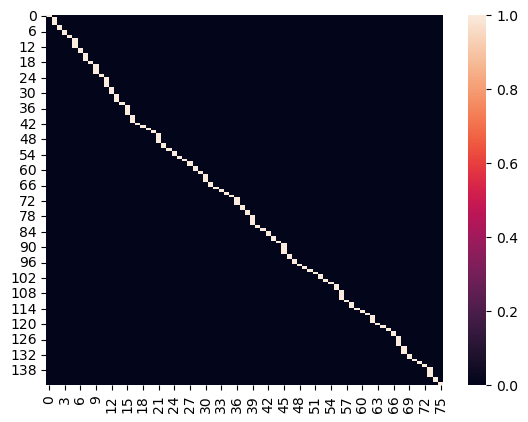

In [33]:
sns.heatmap(sbj_ids_extra_cols)

In [34]:
# 3. Create an augmented design matrix that combines the basic one (already saved), with this additional information
DESIGN_MATRIX_AUGMENTED      = np.concatenate([DESIGN_MATRIX, sbj_ids_extra_cols],axis=1)
DESIGN_MATRIX_AUGMENTED_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_Augmented.txt')
# 4. Save the Matrix to disk
np.savetxt(DESIGN_MATRIX_AUGMENTED_PATH,DESIGN_MATRIX_AUGMENTED,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_AUGMENTED_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(DESIGN_MATRIX_AUGMENTED.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix_Augmented.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 78)]


<Axes: >

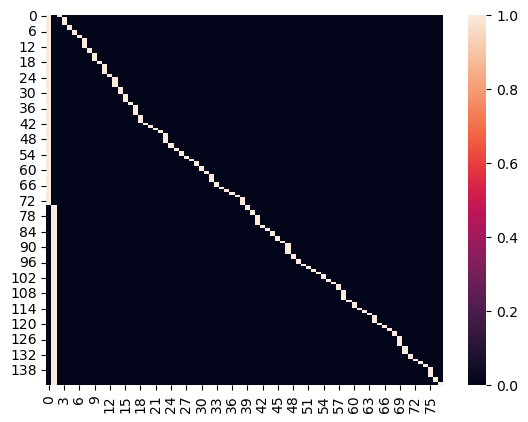

In [35]:
sns.heatmap(DESIGN_MATRIX_AUGMENTED)

In [36]:
DESIGN_MATRIX_ONLYSBJ_COLS_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_SbjCols.txt')
np.savetxt(DESIGN_MATRIX_ONLYSBJ_COLS_PATH,sbj_ids_extra_cols,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_ONLYSBJ_COLS_PATH )
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(sbj_ids_extra_cols.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix_SbjCols.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 76)]


In [37]:
contrast_a = []
for sbj in sbj_unq_list:
    aux = SELECTED_SCANS.loc[sbj]['Cluster Label'].values[0]
    if aux == 'Image-Pos-Others':
        contrast_a.append(1)
    else:
        contrast_a.append(-1)
print(contrast_a)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]


In [38]:
CONTRAST_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_Contrast_SbjCols.txt')
np.savetxt(CONTRAST_PATH,np.array(contrast_a).reshape(1,-1),delimiter=' ',fmt='%d')

In [39]:
CONTRAST = [1 if i == 'Image-Pos-Others' else 0 for i in SELECTED_SCANS['Cluster Label'].values]
CONTRAST_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_Contrast_SbjCols.txt')
np.savetxt(CONTRAST_PATH,np.array(CONTRAST).reshape(1,-1),delimiter=' ',fmt='%d')

In [40]:
# 1. Get list of subjects
sbj_list_str = np.array([item.split('.')[0] for item in sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].coords['scan'].values]).reshape(-1,1)
# 2. Hot-One Encode the list of subjects
sbj_ids_extra_cols = OneHotEncoder().fit_transform(sbj_list_str).todense()
# 3. Create an augmented design matrix that combines the basic one (already saved), with this additional information
DESIGN_MATRIX_AUGMENTED      = np.concatenate([DESIGN_MATRIX, sbj_ids_extra_cols],axis=1)
DESIGN_MATRIX_AUGMENTED_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_Augmented.txt')
# 4. Save the Matrix to disk
np.savetxt(DESIGN_MATRIX_AUGMENTED_PATH,DESIGN_MATRIX_AUGMENTED,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_AUGMENTED_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(DESIGN_MATRIX_AUGMENTED.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix_Augmented.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 78)]


In [41]:
EXCHANGE_BLOCKS = OrdinalEncoder(dtype=int).fit_transform(sbj_list_str).flatten() + 1
#EXCHANGE_BLOCKS = EXCHANGE_BLOCKS.reshape(1,-1)

In [42]:
DM3 = np.concatenate([DESIGN_MATRIX,EXCHANGE_BLOCKS.reshape(-1,1)],axis=1)
DM3_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_ANCONVA.txt')
np.savetxt(DM3_PATH,DM3,delimiter=' ',fmt='%d')

In [43]:
DESIGN_MATRIX_B_AUGMENTED      = np.concatenate([DESIGN_MATRIX_B, sbj_ids_extra_cols],axis=1)
DESIGN_MATRIX_B_AUGMENTED_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_DesingMatrix_B_Augmented.txt')
# 4. Save the Matrix to disk
np.savetxt(DESIGN_MATRIX_B_AUGMENTED_PATH,DESIGN_MATRIX_B_AUGMENTED,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % DESIGN_MATRIX_B_AUGMENTED_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(DESIGN_MATRIX_B_AUGMENTED.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_DesingMatrix_B_Augmented.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144, 78)]


In [46]:
# 3. Create an augmented design matrix that combines the basic one (already saved), with this additional information
EXCHANGE_BLOCKS_PATH = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_ExchangeBlocks.txt')
# 4. Save the Matrix to disk
np.savetxt(EXCHANGE_BLOCKS_PATH,EXCHANGE_BLOCKS,delimiter=' ',fmt='%d')
print('++ INFO: Design Matrix for 2 Cluster solution saved in [%s]' % EXCHANGE_BLOCKS_PATH)
print('++ INFO: Design Matrix for 2 Cluster solution has shape [%s]' % str(EXCHANGE_BLOCKS.shape))

++ INFO: Design Matrix for 2 Cluster solution saved in [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_ExchangeBlocks.txt]
++ INFO: Design Matrix for 2 Cluster solution has shape [(144,)]


## 3.2. Create Data Folder for this solution

Once more, to make sure all things are consistent, we will create empty folders before we start copying the scan-wise FC matrices

In [47]:
for ATLAS_NAME in [ATLAS_NAME]:
    NBS_CL02_matrices_folder = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_Data')
    if osp.exists(NBS_CL02_matrices_folder):
        print("++ WARNING: Removing pre-existing folder [%s]" % NBS_CL02_matrices_folder)
        rmtree(NBS_CL02_matrices_folder)
    os.mkdir(NBS_CL02_matrices_folder)
    print("++ INFO: Creating empty folder [%s]" % NBS_CL02_matrices_folder)

++ WARNING: Removing pre-existing folder [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_Data]
++ INFO: Creating empty folder [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans-no-across/NBS_CL02_Data]


## 3.3. Make copies of matrices into the folder

In [48]:
%%time
for ATLAS_NAME in tqdm([ATLAS_NAME], desc='Atlas'):
    NBS_CL02_matrices_folder = osp.join(SUBJECT_LEVEL_DIR,'NBS_CL02_Data')
    for i,item in enumerate(list(sfc_Z_xr[ATLAS_NAME].indexes['scan'])):
        dest_path = osp.join(NBS_CL02_matrices_folder,'subject{id}.txt'.format(id=str(i+1).zfill(3)))
        np.savetxt(dest_path,sfc_Z_xr[ATLAS_NAME].loc[item,:,:],delimiter=' ',fmt='%f')

Atlas: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.72s/it]

CPU times: user 3.5 s, sys: 122 ms, total: 3.62 s
Wall time: 3.72 s


### 3dLMEr

In [8]:
RESOURCES_3dLMRr_DIR = '/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/'

In [71]:
if osp.exists(osp.join(RESOURCES_3dLMRr_DIR,'Data')):
    rmtree(osp.join(RESOURCES_3dLMRr_DIR,'Data'))
os.mkdir(osp.join(RESOURCES_3dLMRr_DIR,'Data'))

In [75]:
for scan in tqdm(sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].scan.values):
    sbj_id, scan_id = scan.split('.')
    this_scan_fc_matrix = sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].loc[scan].values
    this_scan_fc_vector = squareform(this_scan_fc_matrix, checks=False)
    this_scan_fc_vector_path = osp.join(RESOURCES_3dLMRr_DIR,'Data',f'{sbj_id}_{scan_id}.1D')
    np.savetxt(this_scan_fc_vector_path,this_scan_fc_vector,fmt='%.8f')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 144/144 [00:11<00:00, 12.72it/s]


In [91]:
analysis_script_path = f'/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/{FINAL_SELECTION}.txt'
with open(analysis_script_path, 'w') as the_file:
    the_file.write('module load R\n')
    the_file.write('module load afni\n')
    the_file.write('\n')
    the_file.write('# Is SS = 3 (marginal) the correct type?\n')
    the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
    the_file.write('\n')
    the_file.write('3dLMEr -prefix LME               \\\n')
    the_file.write('       -jobs 32                  \\\n')
    the_file.write('       -model  \'group+(1|Subj)\'  \\\n')
    the_file.write('       -SS_type 3                \\\n')
    the_file.write('       -bounds -2 2              \\\n')
    the_file.write('       -gltCode Imag_Pos_Others \'group : 1*Imag_Pos_Others\'                                \\\n')
    the_file.write('       -gltCode Surr_Neg_Self   \'group : 1*Surr_Neg_Self\'                                  \\\n')
    the_file.write('       -gltCode Imag_Pos_Others-Surr_Neg_Self \'group : 1*Imag_Pos_Others -1*Surr_Neg_Self\' \\\n')
    the_file.write('      -dataTable \\\n')
    for scan in tqdm(sfc_Z_xr['Schaefer2018_400Parcels_7Networks_AAL2'].scan.values):
        sbj_id, scan_id          = scan.split('.')
        this_scan_group          = W_plus.loc[sbj_id,scan_id]['Cluster Label'].replace('-','_')
        this_scan_fc_vector_path = osp.join(RESOURCES_3dLMRr_DIR,'Data',f'{sbj_id}_{scan_id}.1D')
        the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
the_file.close()
#AUX = SELECTED_SCANS['Cluster Label'].copy()
#AUX = AUX.replace('Surr-Neg-Self','Surr_Neg_Self')
#AUX = AUX.replace('Image-Pos-Others','Image_Pos_Others')
#AUX.to_csv(f'/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/{FINAL_SELECTION}.txt', sep='\t', header=None, lineterminator="\t\\\n")

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 144/144 [00:00<00:00, 7546.63it/s]


Subject     Run                      
sub-010014  post-ses-02-run-02-acq-AP       Surr_Neg_Self
            post-ses-02-run-02-acq-PA       Surr_Neg_Self
sub-010080  post-ses-02-run-02-acq-PA    Image_Pos_Others
sub-010082  post-ses-02-run-01-acq-AP       Surr_Neg_Self
            post-ses-02-run-01-acq-PA       Surr_Neg_Self
                                               ...       
sub-010072  post-ses-02-run-02-acq-PA    Image_Pos_Others
sub-010076  post-ses-02-run-01-acq-AP    Image_Pos_Others
sub-010077  post-ses-02-run-01-acq-AP    Image_Pos_Others
            post-ses-02-run-01-acq-PA    Image_Pos_Others
            post-ses-02-run-02-acq-AP    Image_Pos_Others
Name: Cluster Label, Length: 144, dtype: object

# 4. Run NBS Analysis in Matlab

1. Open Matlab

2. Load the Path to NBS

```addpath(genpath('/data/SFIMJGC_HCP7T/hcp7t_fv_sleep_extraSW/NBS1.2/'))```

3. Configure NBS appropriately for each of the contrasts

    a. Image-Pos-Others
    
    * ```Design Matrix = /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/NBS_CL02_DesingMatrix.txt```
    * ```Contrast = [1,-1]```
    * ```Statistical Test = T-test```
    * ```Threshold = 3.1``` equivalent to p<0.001
    * ```Connectivity Matrices = /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/NBS_CL02_Data/subject0001.txt```
    * ```Node Coordinates = /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/Schaefer2018_400Parcels_7Networks_AAL2_NBS_Node_Coordinates.txt```
    * ```Node Labels = /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/Schaefer2018_400Parcels_7Networks_AAL2_NBS_Node_Labels.txt```
    * ```Permutations = 5000```
    * ```Significance = 0.05```
    * ```Method = Network-Based Statistics (NBS)```
    * ```Component Size = Extent```
    
    Once the program finish, please save the results as: ```/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/NBS_CL02_Results/NBS_CL02_Image-Pos-Others_gt_Surr-Neg-Self.mat```

    b. Surr-Neg-Self
    
    Same as above, except for contast, please use ```Contrast = [-1,1]```
    
    And save results as ```/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/NBS_CL02_Results/NBS_CL02_Surr-Neg-Self_gt_Image-Pos-Others.mat```


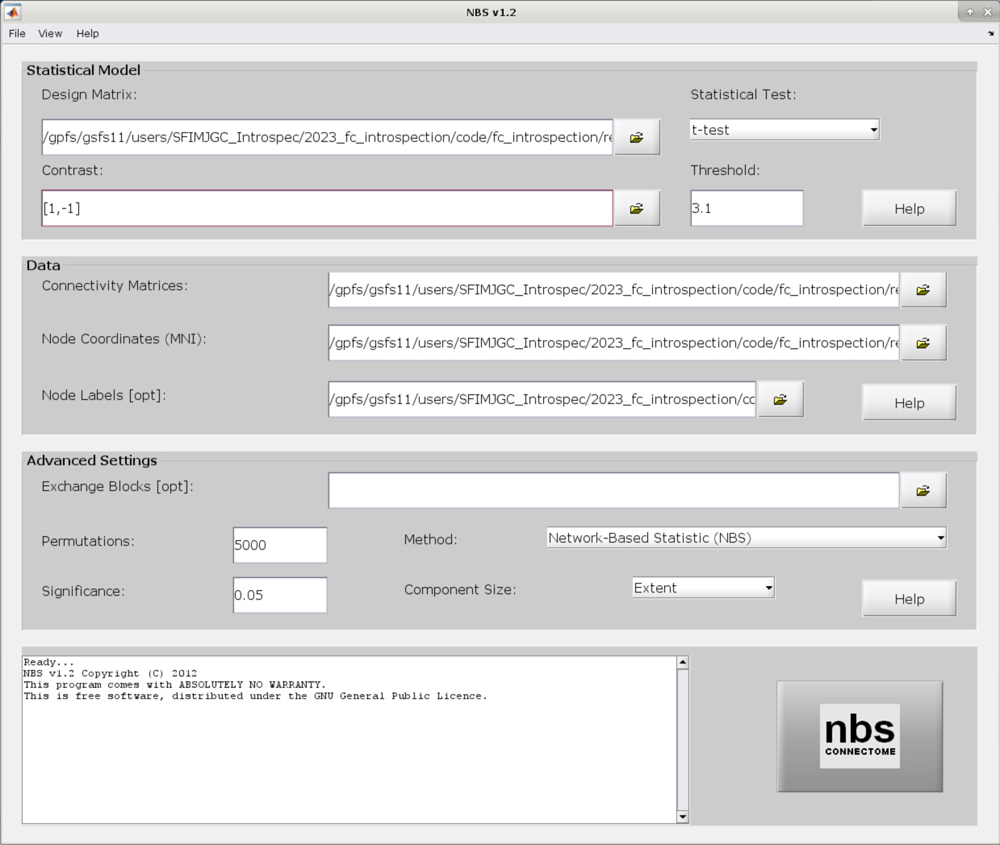

In [20]:
display.Image('./figures/S13_NBS_Configuration.png', width=1200)

***
## 3dLMEr results

In [81]:
RESOURCES_3dLMRr_DIR = '/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/3dLMEr/'

In [82]:
LME_RESULTS_PATH = osp.join(RESOURCES_3dLMRr_DIR,'LME_nii.1D')
LME_RESULTS = pd.read_csv(LME_RESULTS_PATH, sep=' ', comment='#', header=None)
LME_RESULTS = LME_RESULTS.drop(0,axis=1)
LME_RESULTS.columns = ['group.chisq2', 'Image_Pos_Others', 'Image_Pos_Others.Z',
       'Surr_Neg_Self', 'Surr_Neg_Self.Z', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.Z']

In [83]:
LME_RESULTS_Q_PATH = osp.join(RESOURCES_3dLMRr_DIR,'LME_nii_qval.1D')
LME_RESULTS_Q = pd.read_csv(LME_RESULTS_Q_PATH, sep=' ', comment='#', header=None)
LME_RESULTS_Q = LME_RESULTS_Q.drop(0,axis=1)
LME_RESULTS_Q.columns = ['group.chisq2', 'Image_Pos_Others', 'Image_Pos_Others.Z',
       'Surr_Neg_Self', 'Surr_Neg_Self.Z', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.Z']

In [84]:
ATLASINFO_PATH = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
roi_info       = pd.read_csv(ATLASINFO_PATH)

Count the number of networks and get their names

In [85]:
networks = list(roi_info['Network'].unique())
print(networks, len(networks))

['Vis', 'SomMot', 'DorsAttn', 'SalVentAttn', 'Limbic', 'Cont', 'Default', 'Subcortical'] 8


In [86]:
LME_RESULTS_Q.head(10)

,group.chisq2,Image_Pos_Others,Image_Pos_Others.Z,Surr_Neg_Self,Surr_Neg_Self.Z,Image_Pos_Others-Surr_Neg_Self,Image_Pos_Others-Surr_Neg_Self.Z
0,0.999497,0.639017,7.863730e-16,0.613161,7.943800e-16,0.025856,0.999467
1,0.999497,0.661926,7.863730e-16,0.713470,7.943800e-16,-0.051544,0.999467
2,0.999497,0.571011,7.863730e-16,0.639744,7.943800e-16,-0.068733,0.982273
3,0.999497,0.429088,7.863730e-16,0.497332,7.943800e-16,-0.068244,0.999467
4,0.999595,0.388318,7.863730e-16,0.388001,7.943800e-16,0.000317,0.999573
5,0.999497,0.414572,7.863730e-16,0.438621,7.943800e-16,-0.024048,0.999467
6,0.999497,0.608346,7.863730e-16,0.658763,7.943800e-16,-0.050417,0.999467
7,0.999497,0.322494,7.863730e-16,0.354219,7.943800e-16,-0.031725,0.999467
8,0.999497,0.275295,7.863730e-16,0.366714,7.943800e-16,-0.091419,0.925752
9,0.999497,0.305584,7.863730e-16,0.361197,7.943800e-16,-0.055613,0.999467


In [87]:
LME_RESULTS.head(10).sort_values(by='Image_Pos_Others-Surr_Neg_Self', ascending=False)

,group.chisq2,Image_Pos_Others,Image_Pos_Others.Z,Surr_Neg_Self,Surr_Neg_Self.Z,Image_Pos_Others-Surr_Neg_Self,Image_Pos_Others-Surr_Neg_Self.Z
0,1.259790,0.639017,21.75440,0.613161,21.1792,0.025856,0.626904
4,0.010905,0.388318,11.77410,0.388001,11.9102,0.000317,0.006837
5,1.279870,0.414572,15.39270,0.438621,16.4680,-0.024048,-0.634878
7,1.769540,0.322494,11.78280,0.354219,13.0667,-0.031725,-0.823547
6,3.147550,0.608346,21.61060,0.658763,23.6104,-0.050417,-1.272020
1,2.754590,0.661926,20.81550,0.713470,22.7487,-0.051544,-1.154040
9,3.449820,0.305584,10.50750,0.361197,12.5629,-0.055613,-1.359890
3,3.686240,0.429088,12.59030,0.497332,14.7943,-0.068244,-1.425600
2,5.439520,0.571011,21.90330,0.639744,24.6676,-0.068733,-1.869130
8,7.662310,0.275295,9.95837,0.366714,13.3874,-0.091419,-2.349040


Load the connections that are significantly stronger for the contrast: $$Image-Pos-Others > Surr-Neg-Self$$

In [88]:
print(LME_RESULTS.columns)

Index(['group.chisq2', 'Image_Pos_Others', 'Image_Pos_Others.Z',
       'Surr_Neg_Self', 'Surr_Neg_Self.Z', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.Z'],
      dtype='object')


In [99]:
mat_dict = {}
for data_type in LME_RESULTS.columns:
    mat_dict[data_type] = squareform(LME_RESULTS[data_type])

<Axes: >

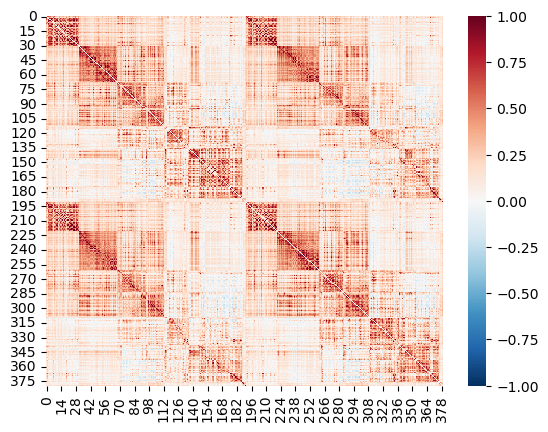

In [105]:
sns.heatmap(mat_dict['Image_Pos_Others'], cmap='RdBu_r', vmin=-1, vmax=1)

<Axes: >

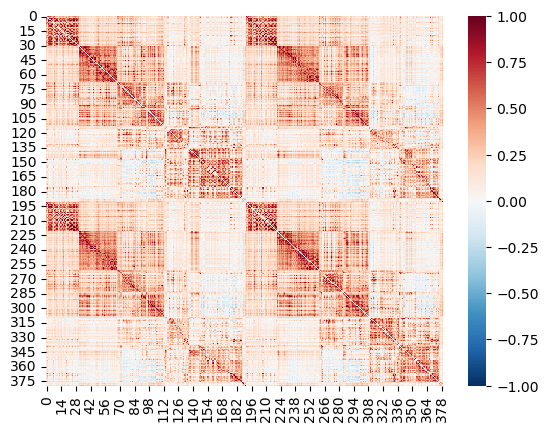

In [106]:
sns.heatmap(mat_dict['Surr_Neg_Self'], cmap='RdBu_r', vmin=-1, vmax=1)

<Axes: >

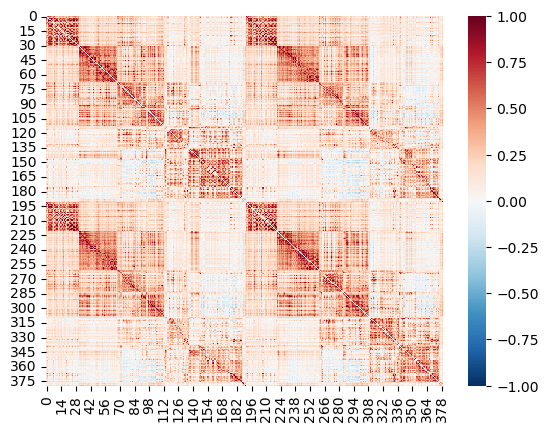

In [90]:
mat = squareform(LME_RESULTS['Surr_Neg_Self'])
sns.heatmap(mat, cmap='RdBu_r', vmin=-1, vmax=1)

<Axes: >

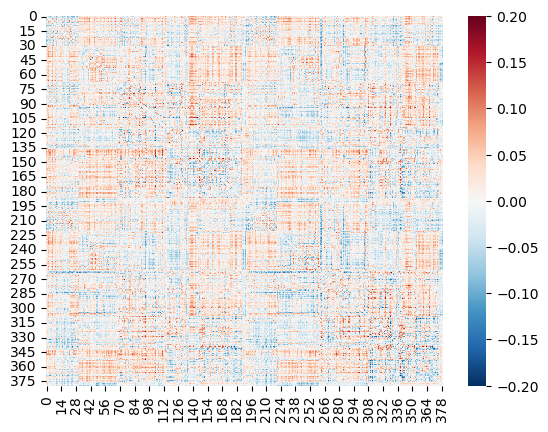

In [91]:
mat = squareform(LME_RESULTS['Image_Pos_Others-Surr_Neg_Self'])
sns.heatmap(mat, cmap='RdBu_r', vmin=-.2, vmax=.2)

<Axes: >

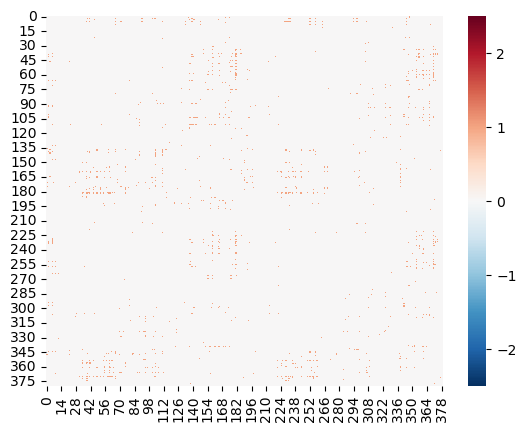

In [107]:
mat = squareform(LME_RESULTS['Image_Pos_Others-Surr_Neg_Self.Z']>2.5)
sns.heatmap(mat, cmap='RdBu_r', vmin=-2.5, vmax=2.5)

In [16]:
from utils.plotting import hvplot_fc

In [17]:
data = pd.DataFrame(mat,index   = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index, 
                           columns = roi_info.set_index(['Hemisphere','Network','ROI_Name','ROI_ID','RGB']).index)

In [146]:
aux = ((data.loc[:,networks,:].T.loc[:,networks,:].T).abs()>1.96)
aux.astype(int)
aux2 = aux.astype(int) * (data.loc[:,networks,:].T.loc[:,networks,:].T)

In [147]:
hvplot_fc(aux2, 
          by='Network', 
          add_color_segments=True, 
          add_labels=True, 
          clim=(-3,3),
          cmap=['#4472C4','#ffffff','#ED7D31'], 
          major_label_overrides={-0.5:'Surr-Neg-Self > Images-Pos-Others',0:'',0.5:'Images-Pos-Others > Surr-Neg-Self'}, 
          colorbar_position='top').opts(toolbar=None)


:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Networks)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

In [26]:
a

:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Networks)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

In [145]:
from scipy.stats import norm
norm.sf(abs(1.96))*2

0.04999579029644087